In [1]:
import torch 

## Imaging  library
from PIL import Image
from torchvision import transforms as tfms

from torch import autocast
import random
import bisect
## Basic libraries
# from fastdownload import FastDownload
import numpy as np
import cv2
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from IPython.display import display
import shutil
import os

## For video display
from IPython.display import HTML
from base64 import b64encode


## Import the CLIP artifacts 
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, LMSDiscreteScheduler

## Initiating tokenizer and encoder.
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16)
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16).to("cuda")

## Initiating the VAE
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae", torch_dtype=torch.float16).to("cuda")

## Initializing a scheduler and Setting number of sampling steps
scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)
scheduler.set_timesteps(50)

## Initializing the U-Net model
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet", torch_dtype=torch.float16).to("cuda")


## Helper functions
def load_image(p):
    '''
    Function to load images from a defined path
    '''
    return Image.open(p).convert('RGB').resize((512,512))

def pil_to_latents(image):
    '''
    Function to convert image to latents
    '''
    init_image = tfms.ToTensor()(image).unsqueeze(0) * 2.0 - 1.0
    init_image = init_image.to(device="cuda", dtype=torch.float16) 
    init_latent_dist = vae.encode(init_image).latent_dist.sample() * 0.18215
    return init_latent_dist

def latents_to_pil(latents):
    '''
    Function to convert latents to images
    '''
    latents = (1 / 0.18215) * latents
    with torch.no_grad():
        image = vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    return pil_images

def text_enc(prompts, maxlen=None):
    '''
    A function to take a texual promt and convert it into embeddings
    '''
    if maxlen is None: maxlen = tokenizer.model_max_length
    inp = tokenizer(prompts, padding="max_length", max_length=maxlen, truncation=True, return_tensors="pt") 
    return text_encoder(inp.input_ids.to("cuda"))[0].half()

/home/kobayashi/anaconda3/envs/pytorch/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.16.self_attn.q_proj.bias', 'vision_model.encoder.layers.3.layer_norm2.weight', 'vision_model.encoder.layers.5.layer_norm1.bias', 'vision_model.encoder.layers.5.mlp.fc2.bias', 'vision_model.encoder.layers.6.self_attn.v_proj.bias', 'vision_model.encoder.layers.14.self_attn.q_proj.weight', 'vision_model.encoder.layers.9.self_attn.k_proj.weight', 'vision_model.encoder.layers.6.self_attn.q_proj.bias', 'vision_model.encoder.layers.3.layer_norm2.bias', 'vision_model.encoder.layers.16.self_attn.out_proj.weight', 'vision_model.encoder.layers.7.self_attn.out_proj.bias', 'vision_model.

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.
Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


In [2]:
def prompt_2_img_i2i(prompts, init_latents, neg_prompts=None, g=7.5, seed=100, strength =0.8, steps=50, dim=512, save_int=False):
    """
    Diffusion process to convert prompt to image
    """
    # Converting textual prompts to embedding
    text = text_enc(prompt) 

    # Adding negative prompt condition
    bs = len(prompts) 
    if not neg_prompts: uncond =  text_enc([""] * bs, text.shape[1])
    # Adding an unconditional prompt , helps in the generation process
    else: uncond =  text_enc(neg_prompts, text.shape[1])
    emb = torch.cat([uncond, text])
    
    # Setting the seed
    if seed: torch.manual_seed(seed)
    
    # Setting number of steps in scheduler
    scheduler.set_timesteps(steps)
    
    # Figuring initial time step based on strength
    init_timestep = int(steps * strength) 
    timesteps = scheduler.timesteps[-init_timestep]
    timesteps = torch.tensor([timesteps], device="cuda")
    
    # Adding noise to the latents 
    noise = torch.randn(init_latents.shape, generator=None, device="cuda", dtype=init_latents.dtype)
    init_latents = scheduler.add_noise(init_latents, noise, timesteps)
    latents = init_latents
    
    # Computing the timestep to start the diffusion loop
    t_start = max(steps - init_timestep, 0)
    timesteps = scheduler.timesteps[t_start:].to("cuda")
    
    # Iterating through defined steps
    for i,ts in enumerate(tqdm(timesteps)):
        # We need to scale the i/p latents to match the variance
        inp = scheduler.scale_model_input(torch.cat([latents] * 2), ts)
        
        # Predicting noise residual using U-Net
        with torch.no_grad(): u,t = unet(inp, ts, encoder_hidden_states=emb).sample.chunk(2)
            
        # Performing Guidance
        pred = u + g*(t-u)
        
        # Conditioning  the latents
        latents = scheduler.step(pred, ts, latents).prev_sample
        
        # Saving intermediate images
        if save_int: 
            if not os.path.exists(f'./steps'):
                os.mkdir(f'./steps')
            latents_to_pil(latents)[0].save(f'steps/{i:04}.jpeg')
            
    # Returning the latent representation to output an image of 3x512x512
    return latents_to_pil(latents)
def pil2cv(image):
    ''' PIL型 -> OpenCV型 '''
    new_image = np.array(image, dtype=np.uint8)
    if new_image.ndim == 2:  # モノクロ
        pass
    elif new_image.shape[2] == 3:  # カラー
        new_image = cv2.cvtColor(new_image, cv2.COLOR_RGB2BGR)
    elif new_image.shape[2] == 4:  # 透過
        new_image = cv2.cvtColor(new_image, cv2.COLOR_RGBA2BGRA)
    return new_image
##https://qiita.com/derodero24/items/f22c22b22451609908ee

In [13]:
# iec
population = 21 #個体数
init_mutation_rate = 1 #初期個体の変異率の逆数
seed = 10
initial_genes_variation = 30 #大きければ大きいほど初期個体が多様化する。rabbitは25くらい
mutation_genes_variation = 25
X = 3
Y = 7
generations = 50 #世代数
adapt = 3 #選ばれたものがどれくらい選ばれやすいか
gene_length = 64 #遺伝子の数（とりあえず行数にしておく）

#一枚目はdefaultにする
def initialize_gene(feed):
    arr = []
    # Figuring initial time step based on strength
    init_timestep = initial_genes_variation
    timesteps = scheduler.timesteps[-init_timestep]
    timesteps = torch.tensor([timesteps], device="cuda")
    for i in range(population):
        feed_ex = feed.clone()
        if i!=0:
            seed_here = random.randrange(1000)
            torch.manual_seed(seed_here)
            # Adding noise to the latents 
            noise = torch.randn(feed_ex.shape, generator=None, device="cuda", dtype=feed_ex.dtype)
            feed_ex = scheduler.add_noise(feed_ex, noise, timesteps)
        torch.manual_seed(seed)
        arr.append(feed_ex)
    
    return arr

def show_image(images,epoch):
    fig = plt.figure()
    for i in range(len(images)):
        arrPIL = np.asarray(images[i][0])
        #imgの表示
        ax1 = fig.add_subplot(X, Y, i+1)#                 for k in range(cross):
#                     A.append(genes[j][k])
        #タイトルの設定
        ax1.set_title(str(i))
        ax1.axis("off")
        plt.imshow(arrPIL)
    print(epoch)
    plt.savefig("iec/{}.png".format(epoch))
    plt.show()
    
    
        
def evolve(fitness,genes):
    new_genes = []
    index = []
    num = 0
    for i in range(population):
        num += fitness[i]
        index.append(num)
    index.append(num)
    # cross over
    for i in range(population):
        p1 = random.randrange(num)
        p2 = random.randrange(num)
        g1 = bisect.bisect(index,p1)
        g2 = bisect.bisect(index,p2)
        new_gene = genes[g1].clone()
        new_gene1 = genes[g2].clone()
        print(g1,g2)
        cross = random.randrange(gene_length)
#         new_gene[0][0][:cross] = genes[g1][0][0][:cross]
        for j in range(4):
            new_gene[0][j][cross:] = new_gene1[0][j][cross:]
        new_genes.append(new_gene)
                    

        
    #mutation
#     # Figuring initial time step based on strength
    mutate = random.randrange(population)
    init_timestep = mutation_genes_variation
    timesteps = scheduler.timesteps[-init_timestep]
    timesteps = torch.tensor([timesteps], device="cuda")
    seed_here = random.randrange(1000)
    torch.manual_seed(seed_here)
    # Adding noise to the latents 
    noise = torch.randn(new_genes[mutate].shape, generator=None, device="cuda", dtype=new_genes[mutate].dtype)
    new_genes[mutate] = scheduler.add_noise(new_genes[mutate], noise, timesteps)
    torch.manual_seed(seed)
    return new_genes

def rgb_diff(image1,image2):
    diff = 0
    for i in range(512):
        for j in range(512):
            for k in range(3):
                diff += abs(image1[i][j][k]-image2[i][j][k])
    return diff

#最大1000 大きければ大きいほどよい
def calc_fitness(target,images):
    #todo: rgb行列への変換処理
    fitness = []
    for i in range(len(images)):
        diff = rgb_diff(target,pil2cv(images[i][0]))
#         print(diff)
        if diff == 0:
            fitness.append(10000)
        else:
            fitness.append((max(1,(int)((512*512*3*255-diff)/10000))))
    return fitness

100%|██████████| 40/40 [00:04<00:00,  8.62it/s]


0


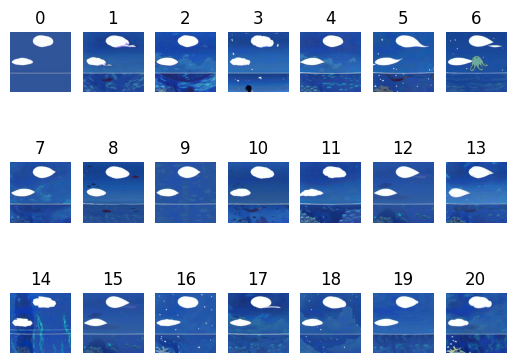

/tmp/ipykernel_792973/3440430359.py:94: RuntimeWarning: overflow encountered in ubyte_scalars
  diff += abs(image1[i][j][k]-image2[i][j][k])


18 11
10 1
18 5
19 4
11 15
19 20
19 1
5 3
0 13
13 0
12 18
5 5
7 16
8 16
3 5
20 4
3 4
13 9
14 0
19 12
11 18


100%|██████████| 40/40 [00:04<00:00,  8.63it/s]


1


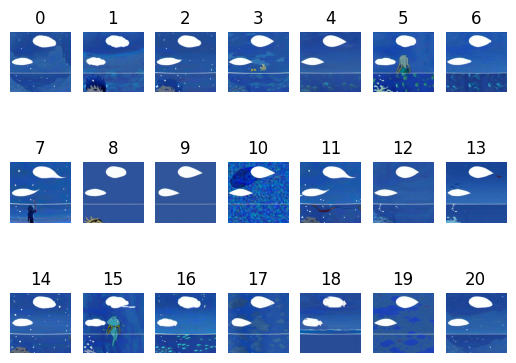

6 6
3 8
4 15
5 4
16 11
9 17
15 2
13 2
10 3
5 6
9 18
6 7
1 13
19 17
7 11
7 19
15 2
13 2
13 2
2 12
17 9


100%|██████████| 40/40 [00:04<00:00,  8.62it/s]


2


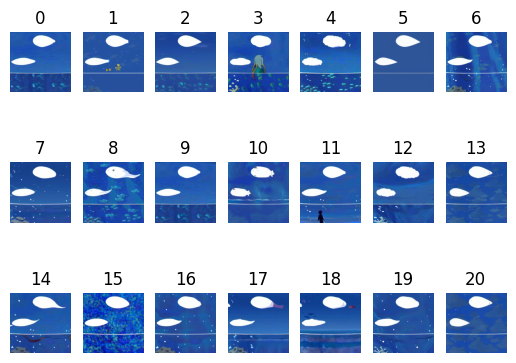

10 4
17 2
10 5
0 2
1 5
2 5
0 2
1 4
1 17
6 3
12 10
18 13
10 20
13 17
18 4
14 2
16 2
12 4
6 9
18 16
17 11


100%|██████████| 40/40 [00:04<00:00,  8.66it/s]


3


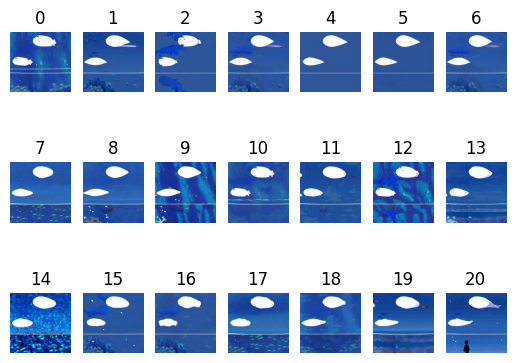

7 4
9 16
8 5
13 4
15 13
5 17
2 0
14 4
0 4
12 7
14 18
15 5
17 4
3 12
20 13
6 3
16 6
2 2
16 20
12 12
12 8


100%|██████████| 40/40 [00:04<00:00,  8.65it/s]


4


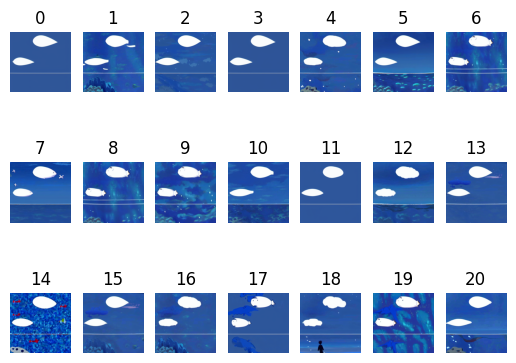

4 3
0 19
17 13
4 19
6 5
9 1
12 2
0 11
17 1
2 0
2 8
0 10
1 17
2 1
17 3
17 4
16 16
1 1
8 11
3 20
12 13


100%|██████████| 40/40 [00:04<00:00,  8.67it/s]


5


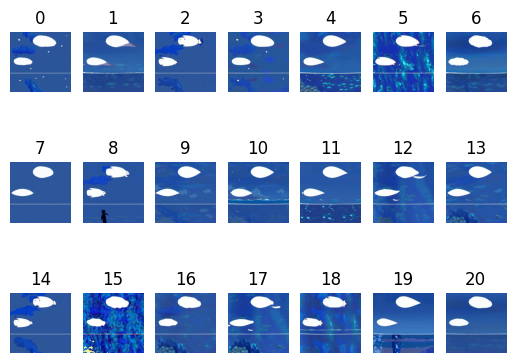

20 17
10 7
16 1
16 8
6 17
3 0
16 5
7 5
12 10
16 6
4 3
3 3
13 11
8 0
0 15
11 12
2 18
20 18
2 6
4 1
14 14


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


6


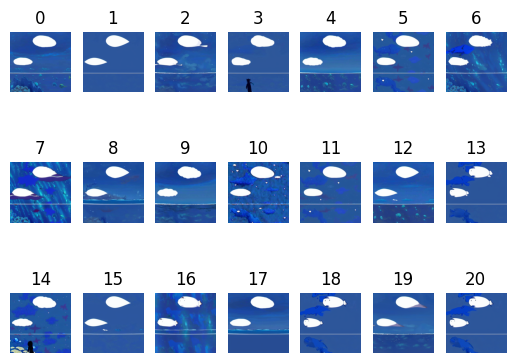

18 18
15 17
8 19
7 18
11 7
3 0
8 7
12 6
14 16
9 18
12 20
8 2
11 20
8 15
12 1
18 7
9 17
20 13
2 2
0 17
3 15


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


7


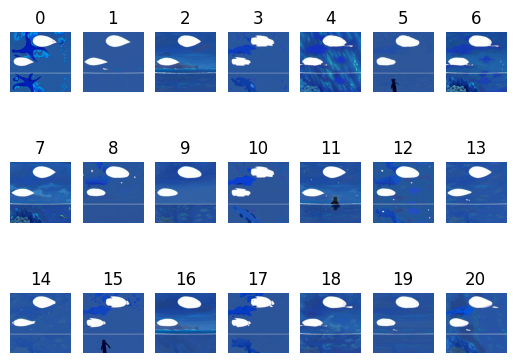

5 8
19 20
6 12
19 18
10 8
11 12
8 10
9 7
8 10
15 13
14 17
4 8
6 0
6 0
1 3
0 2
19 0
10 6
13 12
1 19
3 3


100%|██████████| 40/40 [00:04<00:00,  8.67it/s]


8


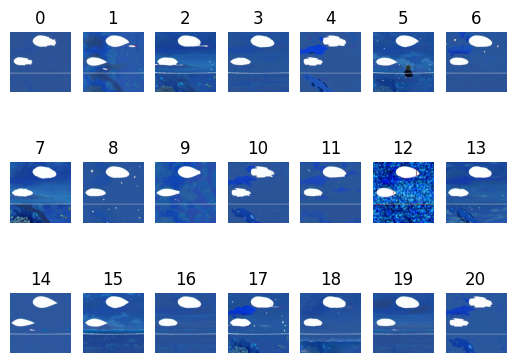

9 9
15 10
8 20
13 2
3 20
12 18
8 10
4 11
5 18
15 16
8 13
15 10
18 7
9 13
7 18
16 10
5 14
18 8
13 10
1 4
7 11


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


9


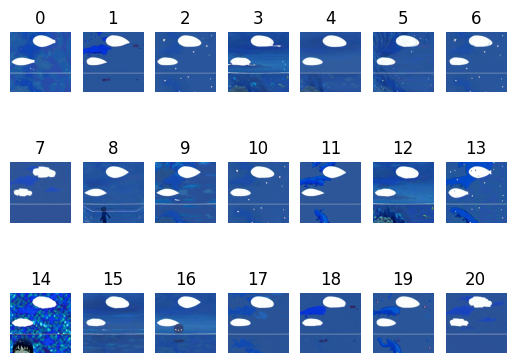

11 15
17 11
8 16
16 7
10 4
7 5
14 16
14 4
1 0
16 1
1 10
20 6
7 15
9 0
18 4
15 2
7 17
5 13
1 14
6 10
3 4


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


10


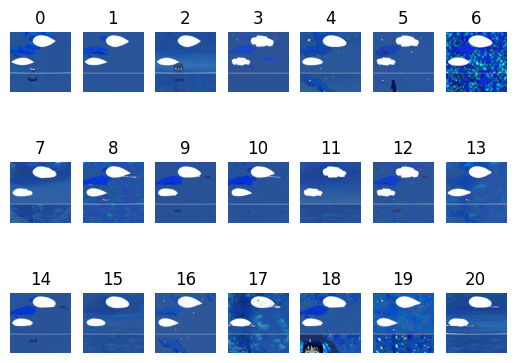

4 15
9 17
1 20
6 9
14 8
8 2
1 9
7 3
9 19
8 16
15 15
10 3
17 3
18 5
19 17
2 20
16 18
6 6
0 16
8 15
1 9


100%|██████████| 40/40 [00:04<00:00,  8.67it/s]


11


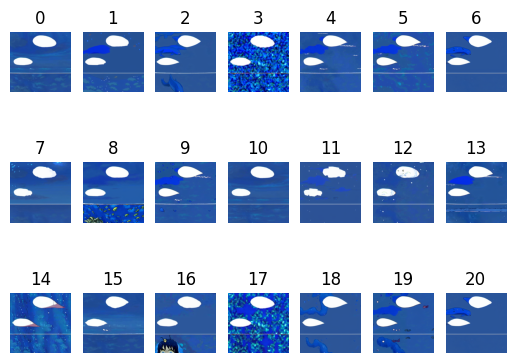

15 5
7 18
19 1
10 10
1 4
7 20
6 4
1 11
0 8
18 4
12 1
10 13
8 12
17 1
7 18
11 18
16 10
11 14
20 13
13 0
2 19


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


12


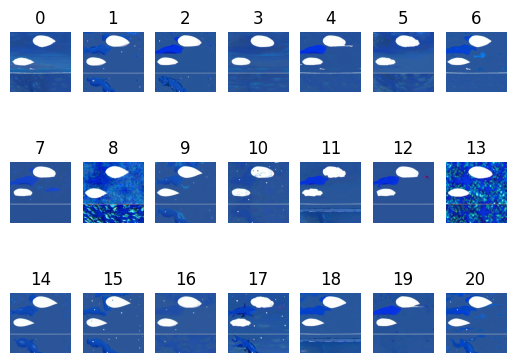

15 14
2 0
12 10
16 20
3 12
14 1
9 17
20 11
19 8
6 5
3 14
8 10
7 15
17 10
13 6
4 19
4 9
18 11
11 5
9 17
3 13


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


13


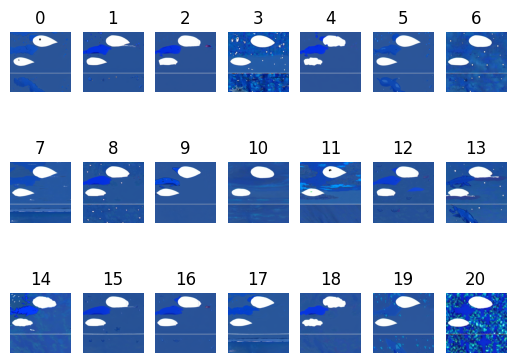

0 1
14 7
10 9
5 2
14 18
13 4
15 0
7 7
5 16
11 10
7 13
6 20
16 6
0 1
13 12
11 17
15 9
13 3
2 1
1 17
12 1


100%|██████████| 40/40 [00:04<00:00,  8.69it/s]


14


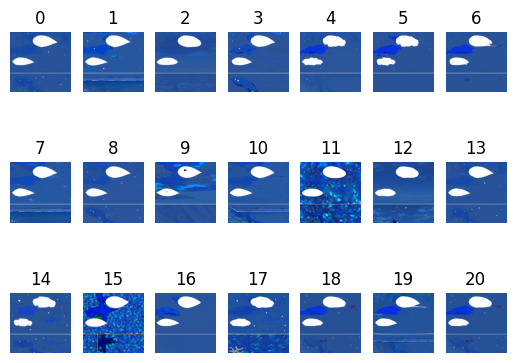

3 16
5 1
13 0
7 13
10 12
18 18
16 9
11 11
2 0
16 13
16 2
17 4
17 11
4 18
8 14
16 19
13 20
4 8
17 7
10 19
7 10


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


15


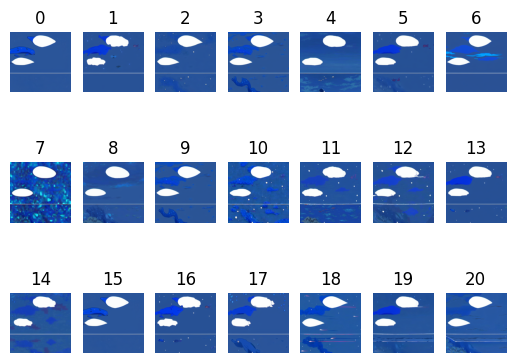

6 13
18 16
16 20
6 6
1 7
17 9
3 9
20 4
7 13
9 6
4 4
5 2
17 16
5 2
7 7
4 19
11 6
12 7
14 13
18 6
3 12


100%|██████████| 40/40 [00:04<00:00,  8.69it/s]


16


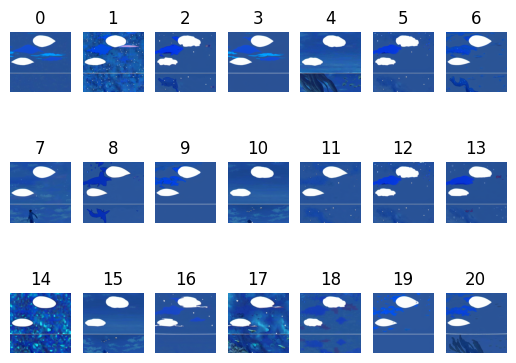

0 19
15 13
2 6
18 16
10 12
6 20
9 2
19 17
3 9
0 9
13 1
19 16
9 4
4 11
6 2
0 17
20 16
11 10
13 13
15 18
4 4


100%|██████████| 40/40 [00:04<00:00,  8.67it/s]


17


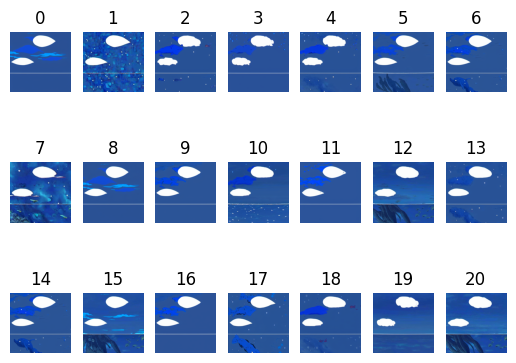

6 17
15 1
11 15
19 5
4 18
19 2
3 14
8 0
3 13
13 4
4 7
1 10
15 20
18 7
4 2
8 13
19 2
8 15
14 11
5 2
0 3


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


18


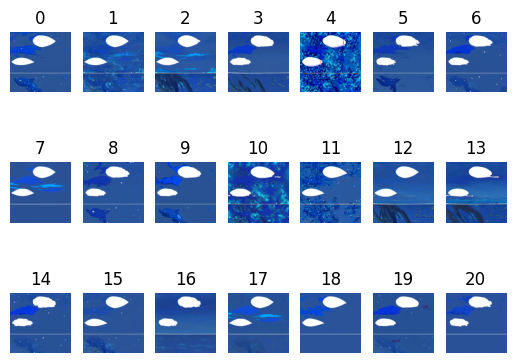

13 19
13 2
19 8
9 9
13 12
12 16
15 3
10 16
3 14
17 3
9 9
1 13
18 17
9 11
14 15
8 2
20 16
4 17
7 15
7 17
2 14


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


19


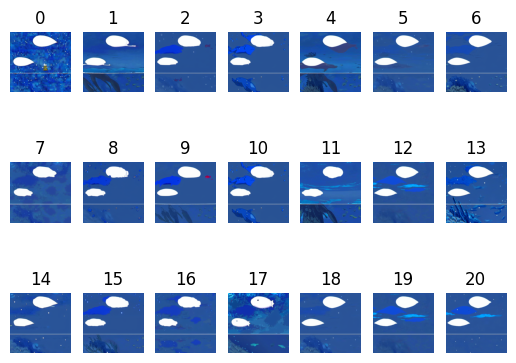

10 15
4 17
6 15
14 4
16 14
20 2
1 10
19 0
17 6
3 16
7 13
17 8
11 0
1 6
18 16
14 12
4 9
5 2
6 9
13 11
10 19


100%|██████████| 40/40 [00:04<00:00,  8.67it/s]


20


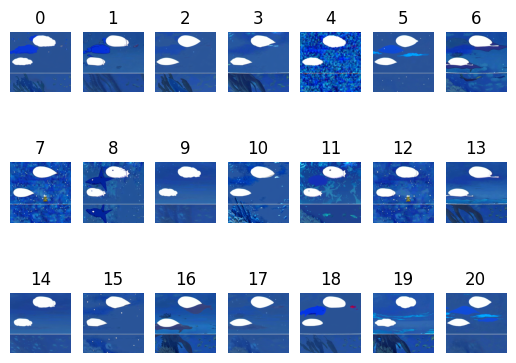

1 16
4 2
7 13
15 8
14 17
19 17
4 15
5 7
8 7
0 13
4 6
15 11
9 10
5 18
16 4
10 19
7 11
15 19
5 17
18 6
20 9


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


21


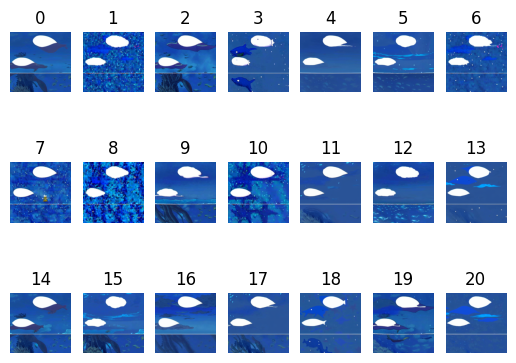

13 19
5 20
11 3
6 8
2 18
5 8
13 9
13 10
18 19
9 13
0 18
3 11
10 2
10 7
17 6
7 4
19 19
17 3
16 4
9 19
1 0


100%|██████████| 40/40 [00:04<00:00,  8.67it/s]


22


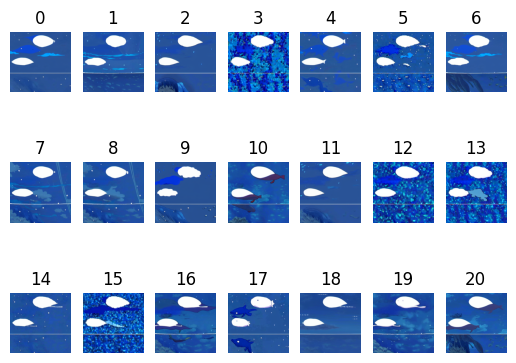

2 16
5 20
11 15
10 13
17 15
17 0
15 2
5 15
6 18
7 15
5 18
15 13
4 1
2 3
12 17
9 11
7 4
16 6
8 5
14 8
7 9


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


23


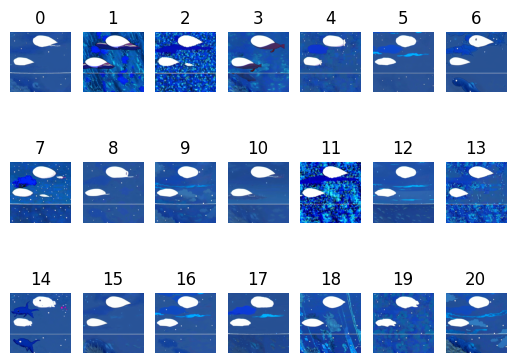

16 0
12 10
12 13
8 1
15 6
20 6
1 18
19 1
6 20
7 1
11 5
0 6
12 6
4 3
1 16
15 16
17 0
0 17
3 3
14 8
7 15


100%|██████████| 40/40 [00:04<00:00,  8.69it/s]


24


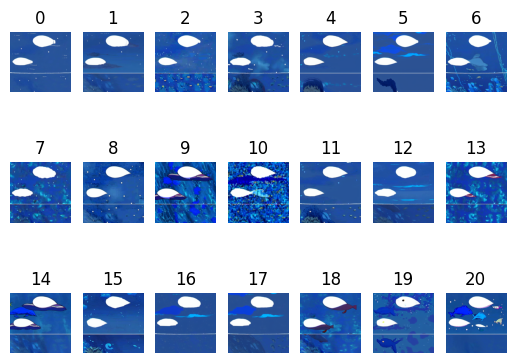

4 6
16 16
12 16
9 20
9 16
6 9
6 8
15 2
10 11
11 5
14 1
13 9
19 14
20 1
10 17
6 7
17 5
7 20
13 20
13 2
20 9


100%|██████████| 40/40 [00:04<00:00,  8.67it/s]


25


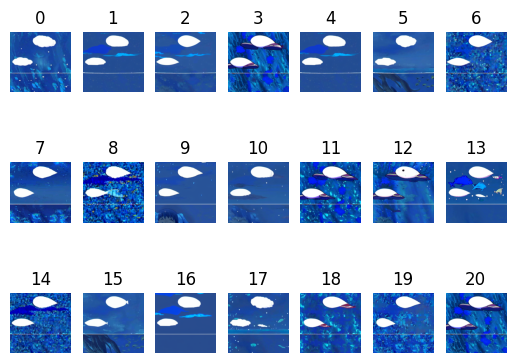

5 8
4 10
13 9
8 8
13 9
5 18
20 16
2 12
9 3
18 13
17 18
8 2
8 12
13 17
5 4
16 19
9 4
20 6
0 12
16 9
0 15


100%|██████████| 40/40 [00:04<00:00,  8.66it/s]


26


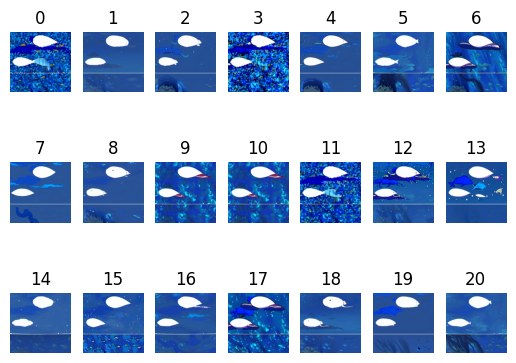

17 11
7 10
19 14
14 3
2 6
1 6
13 1
9 20
5 7
17 9
12 4
18 3
18 8
19 20
15 7
20 20
17 4
2 19
1 6
0 15
18 7


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


27


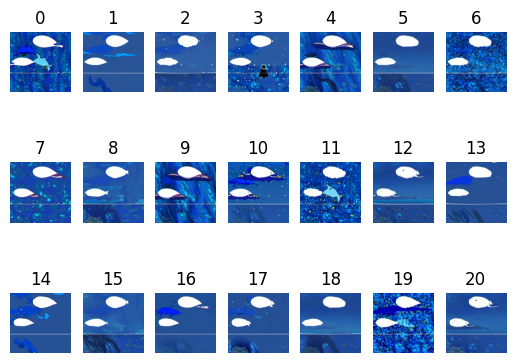

19 11
5 14
5 8
15 14
19 12
20 13
6 12
17 4
10 1
6 9
0 13
7 15
5 18
19 11
13 15
20 4
12 16
17 1
6 4
6 20
16 3


100%|██████████| 40/40 [00:04<00:00,  8.67it/s]


28


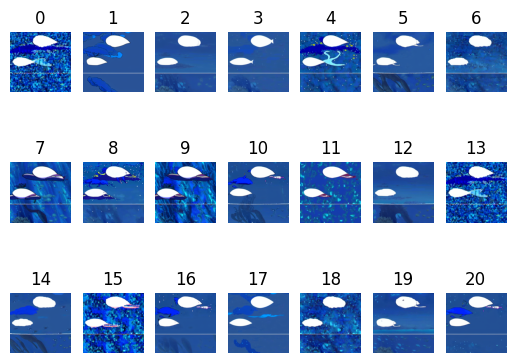

3 19
5 0
15 6
13 3
19 9
0 17
16 9
3 5
19 0
6 17
14 11
11 20
13 13
16 4
16 19
0 11
16 10
11 1
11 6
7 2
5 9


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


29


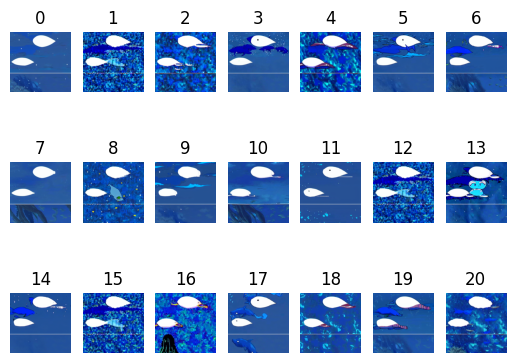

2 6
16 6
4 5
16 18
16 16
8 13
17 6
6 7
12 18
13 5
20 1
4 10
2 16
5 20
17 18
0 8
13 11
18 12
13 11
9 18
0 13


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


30


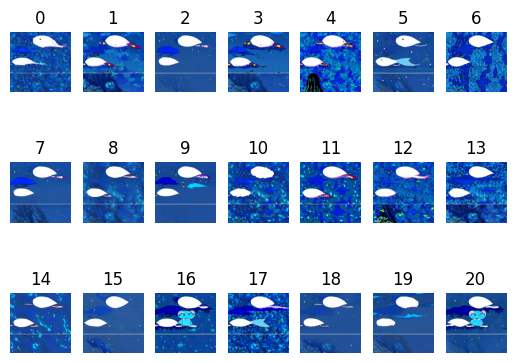

17 1
8 4
17 3
2 18
8 18
5 13
2 13
13 2
0 6
3 20
4 15
7 10
19 5
16 4
17 1
8 8
15 1
14 12
20 12
7 8
19 3


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


31


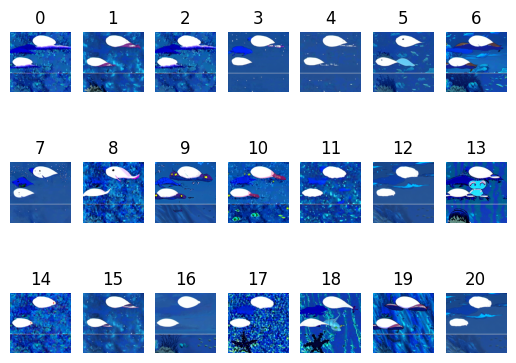

19 7
14 20
6 13
4 12
11 8
3 7
15 3
10 15
2 12
18 15
8 13
15 17
12 1
1 11
5 4
3 3
3 5
17 6
17 1
15 5
2 2


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


32


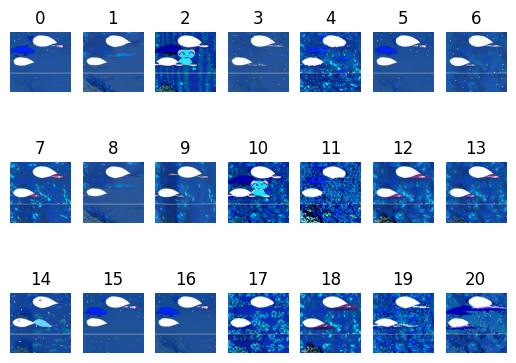

12 15
0 16
15 12
18 9
17 5
5 2
5 16
15 15
17 3
11 2
13 11
8 19
17 16
12 14
14 7
15 4
12 3
5 15
16 19
18 19
9 16


100%|██████████| 40/40 [00:04<00:00,  8.69it/s]


33


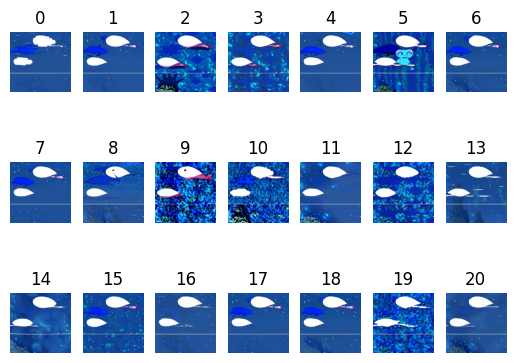

5 18
8 0
3 18
18 5
18 2
9 20
0 15
17 13
19 16
12 7
16 11
7 6
14 18
12 16
13 17
1 13
11 3
13 9
5 13
10 1
0 7


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


34


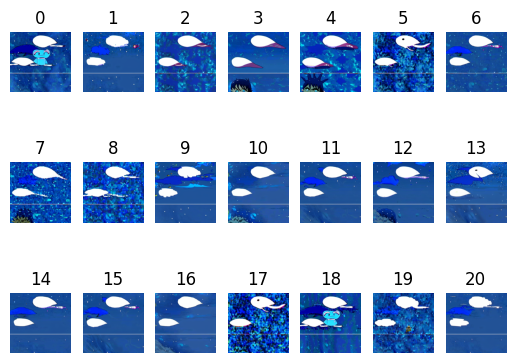

17 6
9 0
20 18
20 6
3 3
13 16
3 11
14 0
13 18
9 17
6 7
6 11
7 1
18 11
20 17
10 13
1 12
18 14
19 18
6 1
4 13


100%|██████████| 40/40 [00:04<00:00,  8.70it/s]


35


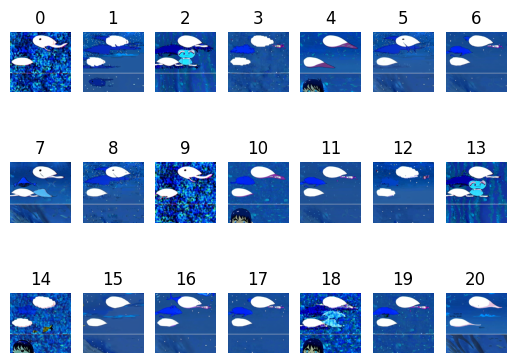

2 4
16 9
17 8
9 3
14 2
19 3
9 20
6 15
3 13
19 15
10 18
12 20
15 17
7 8
3 0
20 0
13 0
9 20
13 17
6 8
4 18


100%|██████████| 40/40 [00:04<00:00,  8.67it/s]


36


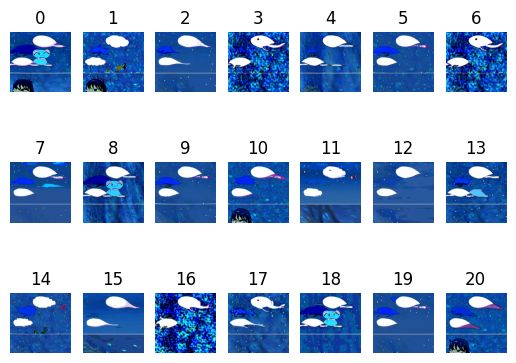

2 10
16 15
4 6
19 8
4 6
16 14
2 4
6 6
4 13
16 2
11 12
16 9
13 6
15 19
4 3
16 11
2 3
17 18
9 7
3 18
7 0


100%|██████████| 40/40 [00:04<00:00,  8.70it/s]


37


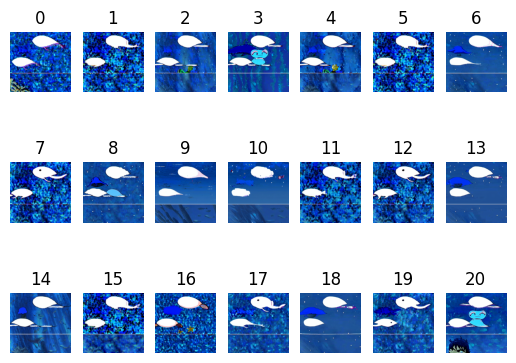

10 10
19 6
19 11
14 11
4 9
13 18
9 1
9 6
20 14
16 8
6 11
14 15
14 13
19 14
7 8
2 5
20 16
7 14
16 14
15 7
13 15


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


38


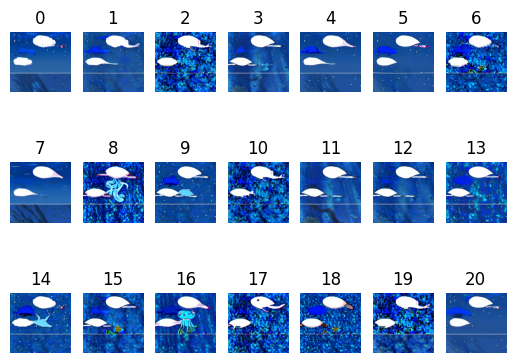

16 9
18 16
9 16
4 3
19 14
0 9
15 12
1 15
11 18
4 9
14 10
8 15
3 16
15 17
13 8
3 5
0 15
1 4
12 2
17 16
4 9


100%|██████████| 40/40 [00:04<00:00,  8.69it/s]


39


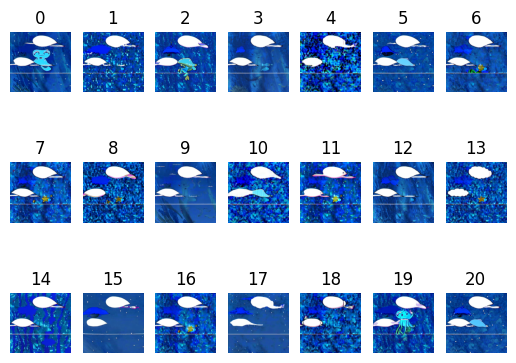

6 13
13 14
14 3
9 17
9 17
17 14
13 2
14 11
9 19
9 10
9 18
17 14
16 10
12 20
19 7
18 2
19 6
9 6
4 5
7 20
0 11


100%|██████████| 40/40 [00:04<00:00,  8.70it/s]


40


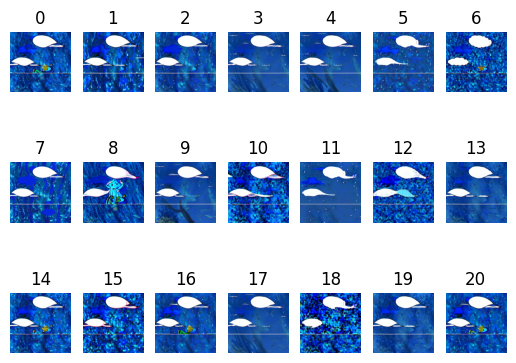

8 14
5 7
15 12
6 4
6 2
10 5
5 10
5 3
6 8
20 9
17 17
8 6
1 4
17 19
17 5
9 10
15 15
14 10
5 0
10 8
1 5


100%|██████████| 40/40 [00:04<00:00,  8.69it/s]


41


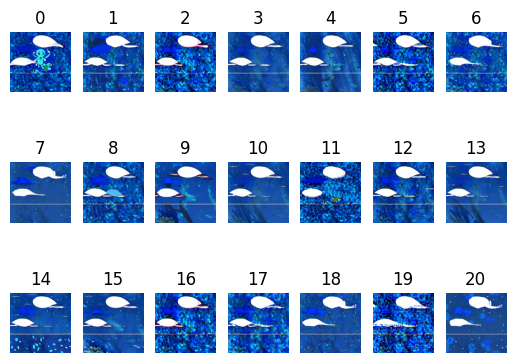

19 4
14 15
2 19
14 19
20 18
20 2
17 5
18 18
6 13
17 2
10 14
9 10
17 16
11 5
7 20
0 18
10 13
14 12
3 3
5 6
5 20


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


42


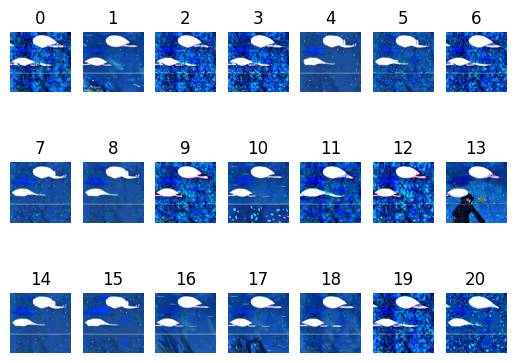

4 4
9 16
11 7
17 17
12 0
7 9
7 7
14 18
11 8
3 7
12 3
5 19
7 1
11 3
19 13
12 5
9 13
3 0
3 15
2 10
17 15


100%|██████████| 40/40 [00:04<00:00,  8.69it/s]


43


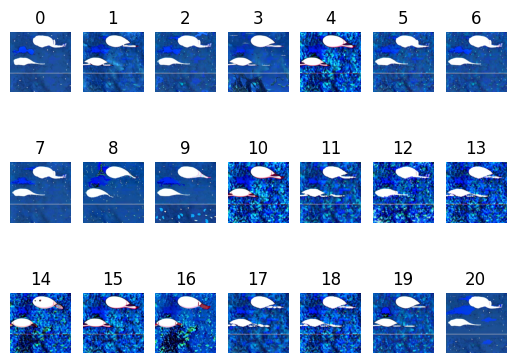

15 20
18 16
7 3
17 1
6 16
20 14
12 17
19 16
7 16
9 17
6 8
18 17
18 4
18 9
8 10
19 6
14 17
4 0
8 11
2 13
3 4


100%|██████████| 40/40 [00:04<00:00,  8.69it/s]


44


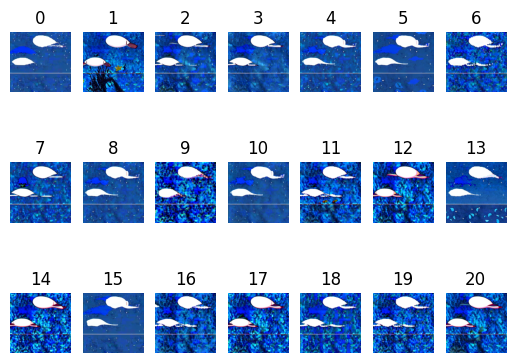

6 20
6 8
1 8
19 11
13 1
1 14
16 6
2 2
19 9
20 13
14 2
5 15
4 15
20 9
8 5
19 17
9 19
4 16
18 6
2 14
18 14


100%|██████████| 40/40 [00:04<00:00,  8.70it/s]


45


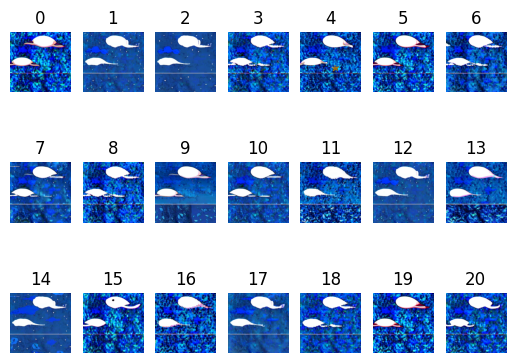

20 5
17 17
14 14
8 10
11 17
2 17
8 7
2 4
15 3
15 6
1 17
13 4
2 19
6 7
5 0
4 11
10 7
3 14
14 15
7 9
2 13


100%|██████████| 40/40 [00:04<00:00,  8.68it/s]


46


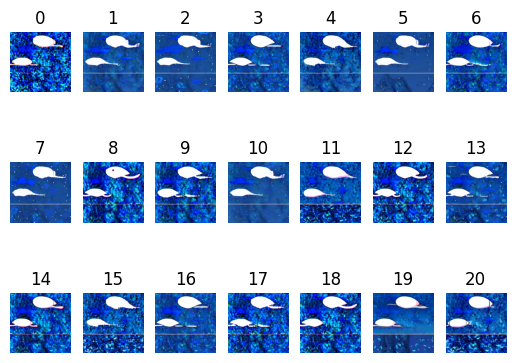

12 7
4 8
4 19
8 5
1 10
16 13
16 10
1 8
16 9
20 1
10 12
3 17
11 4
12 1
11 10
0 20
4 1
10 2
3 0
0 12
1 5


100%|██████████| 40/40 [00:04<00:00,  8.67it/s]


47


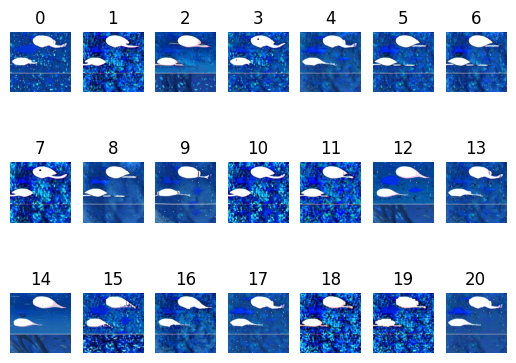

5 19
15 3
9 8
16 0
6 18
6 6
7 7
6 9
11 4
0 10
17 20
3 16
12 7
12 0
2 8
10 15
7 10
9 5
7 11
7 5
13 11


100%|██████████| 40/40 [00:04<00:00,  8.67it/s]


48


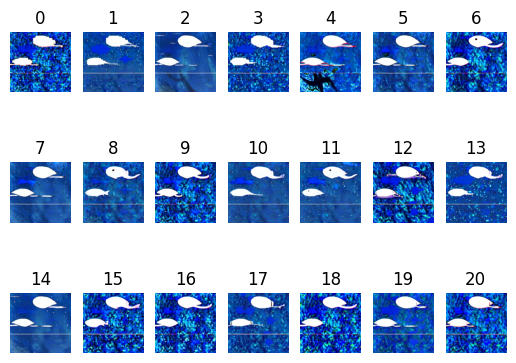

1 10
0 6
17 14
3 8
5 12
6 2
8 14
9 1
2 15
6 8
5 6
11 20
17 12
0 8
20 1
5 17
11 19
14 8
5 6
4 16
11 0


100%|██████████| 40/40 [00:04<00:00,  8.70it/s]


49


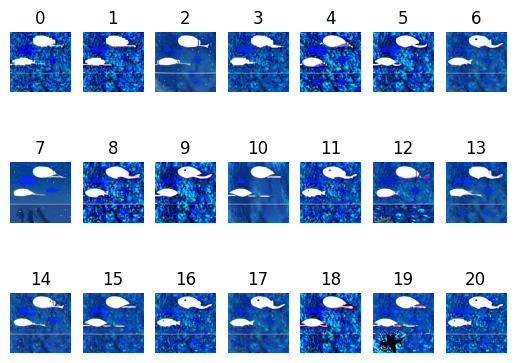

4 14
12 5
20 13
16 0
5 16
11 4
9 2
17 12
17 15
2 10
18 14
1 1
20 12
19 8
3 5
8 12
17 2
15 0
16 7
8 18
1 20


100%|██████████| 40/40 [00:04<00:00,  8.67it/s]


50


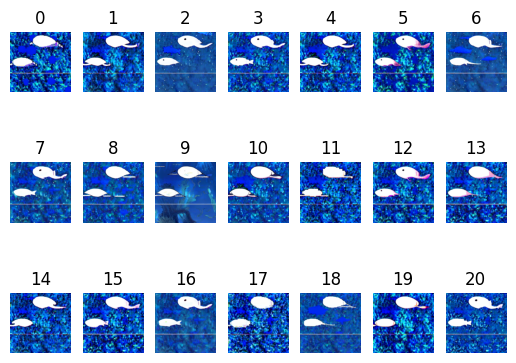

In [14]:
input_image = Image.open("material.jpeg").convert('RGB').resize((512,512))#input file
target_image = Image.open("target.png").convert('RGB').resize((512,512))
prompt = ["Viewing the sky from under the sea,anime"]#input text
# Convert the seed image to latent
feed = pil_to_latents(input_image)
genes = initialize_gene(feed)
with autocast("cuda"):
    #初期配置
    images = []
    for i in range(population):
        image = prompt_2_img_i2i(prompts = prompt, init_latents = genes[i])
        images.append(image)
    show_image(images,0)
    
    #print
#     for g in genes:
#         print(g[0][0][0][0])
#         print(g[0][0][63][63])
        
    #進化+選択
    for i in range(1,generations+1):
        #選択
        fitness = calc_fitness(pil2cv(target_image),images)
        with open('fitness.txt', 'a') as f:
            print(fitness, file=f)
        #進化
        genes = evolve(fitness,genes)
        #画像生成
        images = []
        for j in range(population):
            image = prompt_2_img_i2i(prompts = prompt, init_latents = genes[j])
            images.append(image)
        #表示
        show_image(images,i)
        #print
#         for g in genes:
#             print(g[0][0][0][0])
#             print(g[0][0][63][63])
#             print(g.shape)

In [6]:
with open('fitness.txt', 'a') as f:
    print(fitness, file=f)
    print(fitness, file=f)

In [2]:
from PIL import Image
input_image = Image.open("material.jpeg").convert('RGB').resize((512,512))#input file
# target_image = Image.open("target.png").convert('RGB').resize((512,512))
# input_image-target_image
# import cv2
# import numpy as np

# bgr_array = cv2.imread("material.jpeg")
# print(bgr_array.shape)
# # (512, 512, 3)c
# pip install opencv-python
import numpy as np
import cv2

def pil2cv(image):
    ''' PIL型 -> OpenCV型 '''
    new_image = np.array(image, dtype=np.uint8)
    if new_image.ndim == 2:  # モノクロ
        pass
    elif new_image.shape[2] == 3:  # カラー
        new_image = cv2.cvtColor(new_image, cv2.COLOR_RGB2BGR)
    elif new_image.shape[2] == 4:  # 透過
        new_image = cv2.cvtColor(new_image, cv2.COLOR_RGBA2BGRA)
    return new_image
input_image = pil2cv(input_image)
input_image

array([[[150,  85,  47],
        [150,  85,  47],
        [150,  85,  47],
        ...,
        [150,  85,  47],
        [150,  85,  47],
        [150,  85,  47]],

       [[150,  85,  47],
        [150,  85,  47],
        [150,  85,  47],
        ...,
        [150,  85,  47],
        [150,  85,  47],
        [150,  85,  47]],

       [[150,  85,  47],
        [150,  85,  47],
        [150,  85,  47],
        ...,
        [150,  85,  47],
        [150,  85,  47],
        [150,  85,  47]],

       ...,

       [[150,  85,  47],
        [150,  85,  47],
        [150,  85,  47],
        ...,
        [150,  85,  47],
        [150,  85,  47],
        [150,  85,  47]],

       [[150,  85,  47],
        [150,  85,  47],
        [150,  85,  47],
        ...,
        [150,  85,  47],
        [150,  85,  47],
        [150,  85,  47]],

       [[150,  85,  47],
        [150,  85,  47],
        [150,  85,  47],
        ...,
        [150,  85,  47],
        [150,  85,  47],
        [150,  85,  47]]